# Исследование рынка заведений общественного питания Москвы

В рамках данного исследования наша задача состоит в анализе рынка заведений общественного питания Москвы, поиске интересных особенностей и презентации полученных результатов инвесторам.

В нашем распоряжении датафрейм с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

Для выполнения цели составим план работ:
1. Загрузка и предобработка данных
2. Исследовательский анализ данных
3. Детализация исследования
4. Презентация результатов

Приступим к исследованию!

## Загрузка и предобработка данных

### Загрузка данных

Для начала импортируем нужные библиотеки.

In [1]:
import pandas as pd
import plotly.express as px
from plotly import graph_objects as go
import folium
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import json

Теперь загрузим данные в переменную `data` и изучим основную информацию о них.

In [2]:
try:
    data = pd.read_csv('/Users/macbook/practicum/projects/food_place_project/moscow_places.csv')
except:
    data = pd.read_csv('https://code.s3.yandex.net//datasets/moscow_places.csv')

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
data.sample(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
5945,Руставели,ресторан,"Москва, улица Кржижановского, 4, корп. 1",Юго-Западный административный округ,"ежедневно, 11:30–00:00",55.682760,37.561680,4.8,NaN,NaN,NaN,NaN,0,100.0
2392,Nho,ресторан,"Москва, 1-я Останкинская улица, 55",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.823775,37.633795,3.8,NaN,NaN,NaN,NaN,0,30.0
6468,Wild Bean,кафе,"Москва, Люблинская улица, 44/8",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.683437,37.736744,3.6,NaN,NaN,NaN,NaN,1,NaN
6666,Топ стар,кафе,"Москва, улица Миклухо-Маклая, 7",Юго-Западный административный округ,"ежедневно, 12:00–05:00",55.654604,37.501330,4.1,NaN,NaN,NaN,NaN,0,96.0
2925,Мой дом,кафе,"Москва, Щёлковское шоссе, 9",Восточный административный округ,"ежедневно, круглосуточно",55.805229,37.759214,4.4,NaN,NaN,NaN,NaN,0,90.0
6615,Швили,ресторан,"Москва, проспект Вернадского, 41",Западный административный округ,"ежедневно, 12:00–23:00",55.674590,37.503468,4.4,выше среднего,Средний счёт:1500–1800 ₽,1650.0,NaN,1,NaN
4397,7 Сэндвичей,кофейня,"Москва, Нижний Сусальный переулок, 5, стр. 2",Центральный административный округ,"пн-чт 08:00–23:00; пт 08:00–00:00; сб,вс 09:00...",55.760539,37.662345,4.1,средние,Средний счёт:100–500 ₽,300.0,NaN,1,38.0
4000,Mushrooms,ресторан,"Москва, улица Большая Якиманка, 22",Центральный административный округ,"ежедневно, 09:00–00:00",55.738748,37.615089,4.9,высокие,Средний счёт:3000–3500 ₽,3250.0,NaN,0,80.0
2277,Sova Coffee,кофейня,"Москва, Большая Почтовая улица, 26В, стр. 2",Центральный административный округ,пн-пт 08:00–19:00,55.778410,37.699717,4.4,низкие,Цена чашки капучино:109–169 ₽,NaN,139.0,1,NaN
434,Кафе 11/11,ресторан,"Москва, 3-й Лихачёвский переулок, 11/11",Северный административный округ,"ежедневно, 11:00–23:00",55.848994,37.520525,4.2,средние,Средний счёт:500–1000 ₽,750.0,NaN,0,NaN


Датафрейм содержит информацию о более чем 8 тысячах заведений общественного питания.

Согласно документации к данным столбцы содержат следующую информацию:

* `name` — название заведения
* `address` — адрес заведения
* `category` — категория заведения (например «кафе», «пиццерия» или «кофейня»)
* `hours` — информация о днях и часах работы
* `lat` — широта географической точки, в которой находится заведение
* `lng` — долгота географической точки, в которой находится заведение
* `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0)
* `price` — категория цен в заведении (например «средние», «ниже среднего», «выше среднего» и так далее)
* `avg_bill` — средняя стоимость заказа в виде диапазона (например: «Средний счёт: 1000–1500 ₽», «Цена чашки капучино: 130–220 ₽», «Цена бокала пива: 400–600 ₽» и так далее)
* `middle_avg_bill` — оценка среднего чека
* `middle_coffee_cup` — оценка стоимости одной чашки капучино
* `chain` — признак сетевого заведения
* `district` — административный район, в котором находится заведение (например Центральный административный округ)
* `seats` — количество посадочных мест

### Предобработка данных

#### Работа с пропусками

Проверим, есть ли пропуски в датафрейме.

In [5]:
# рассчитаем количество пропусков в каждом столбце
missing_values = pd.DataFrame(data.isna().sum()).reset_index()
# переименуем столбцы
missing_values.columns = ['column', 'na_count']
# посчитаем долю пропусков от общего количества данных
missing_values['na_%'] = round(missing_values['na_count']/data['name'].count()*100,2)
# отсортируем данные по убыванию % пропусков
missing_values = missing_values.sort_values(by='na_%', ascending=False)

missing_values

,column,na_count,na_%
11,middle_coffee_cup,7871,93.64
10,middle_avg_bill,5257,62.54
8,price,5091,60.56
9,avg_bill,4590,54.60
13,seats,3611,42.96
4,hours,536,6.38
0,name,0,0.00
1,category,0,0.00
2,address,0,0.00
3,district,0,0.00


Наибольшее количество пропусков приходится на данные, связанные с ценами в заведении - оценки стоимости одной чашки капучино (93.64%) и среднего чека (62.54%), средняя стоимость заказа (60.56%) и категория цен в заведении (54.6%). Также много незаполненных данных о количестве посадочных мест (42.96%). Дополнительно, у некоторых заведений не указаны часы работы (6.38%).

В пропусках нет ничего аномального - в подобных данных они часто встречаются. Более того, заполнить эти пропуски усредненным значением было бы некорректно. В связи с этим, мы оставим датафрейм как есть.

#### Обработка дубликатов

Проверим, есть ли дубликаты в датафрейме.

In [6]:
# приведем все текстовые данные к нижнему регистру
data_lowercased = data.applymap(lambda x: x.lower() if isinstance(x, str) else x)
# проведем проверку
data_lowercased.duplicated().sum()

0

В датафрейме нет дубликатов.

#### Добавление столбцов

Выделим название улицы из адреса и добавим ее в столбец `street`.

In [7]:
data['street'] = data['address'].apply(lambda x: x.split(', ')[1])

Добавим признак круглосуточной работы в столбец `is_24_7`.

In [8]:
data['is_24_7'] = data['hours'].apply(lambda x: x=='ежедневно, круглосуточно')

Проверим отображение новых столбцов.

In [9]:
data.sample(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
4272,Buba by Sumosan,ресторан,"Москва, Пресненская набережная, 8с1",Центральный административный округ,"пн-пт 11:00–22:00; сб,вс 12:00–22:00",55.747196,37.539082,4.4,NaN,NaN,NaN,NaN,0,NaN,Пресненская набережная,False
5165,Scrocchiarella,пиццерия,"Москва, Большая Серпуховская улица, 8/7с2",Центральный административный округ,"ежедневно, 10:00–23:00",55.728791,37.624046,4.4,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,1,NaN,Большая Серпуховская улица,False
1845,Мимино,кафе,"Москва, Лесная улица, 1/2",Центральный административный округ,"ежедневно, 12:00–23:30",55.776810,37.585464,4.3,средние,Средний счёт:от 1000 ₽,1000.0,NaN,1,70.0,Лесная улица,False
2932,Сащя,столовая,"Москва, Нижняя Первомайская улица, 16",Восточный административный округ,"ежедневно, 09:00–23:00, перерыв 12:00–12:15",55.790693,37.797578,3.2,NaN,NaN,NaN,NaN,0,NaN,Нижняя Первомайская улица,False
1634,Гивисациви,ресторан,"Москва, Бутырская улица, 89, стр. 2",Северный административный округ,"ежедневно, 12:00–00:00",55.805785,37.581542,4.3,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,0,230.0,Бутырская улица,False
7331,Гранат,кафе,"Москва, улица Верхние Поля, 34, корп. 2",Юго-Восточный административный округ,пн-пт 09:00–20:00,55.667453,37.762079,4.3,средние,Средний счёт:250–450 ₽,350.0,NaN,1,154.0,улица Верхние Поля,False
2304,Бамбл Кофе,булочная,"Москва, улица Гиляровского, 60, стр. 1",Центральный административный округ,"ежедневно, 10:00–20:00",55.787444,37.632966,4.3,NaN,NaN,NaN,NaN,1,44.0,улица Гиляровского,False
6690,Японская кухня,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,NaN,55.657255,37.481547,4.4,NaN,NaN,NaN,NaN,1,1288.0,проспект Вернадского,False
5887,Кулинария,кафе,"Москва, улица Горбунова, 2, стр. 3",Западный административный округ,NaN,55.726480,37.398894,4.4,NaN,NaN,NaN,NaN,1,NaN,улица Горбунова,False
4962,Nicepricecafe,кафе,"Москва, Пятницкая улица, 54, стр. 2",Центральный административный округ,пн-сб 11:00–23:30; вс 12:00–23:30,55.733873,37.627428,4.4,средние,Средний счёт:1000 ₽,1000.0,NaN,1,150.0,Пятницкая улица,False


### Вывод

Мы загрузили данные и провели их предобработку, в ходе которой были изучены данные на наличие пропусков и дубликатов и были добавлены столбцы с дополнительной иныормацией.

Теперь можно приступать к анализу данных.

## Исследовательский анализ данных

### Категории

#### Распределение заведений по категориям

Рассмотрим, какие категории заведений представлены в датафрейме и сколько заведений каждая категория включает.

In [10]:
# сформируем сводную таблицу
places_by_categories = data.pivot_table(index='category', values='name', aggfunc='count').reset_index()
# переименуем столбцы
places_by_categories.columns = ['category', 'amount']
# отсортируем данные по убыванию количества заведений в категории
places_by_categories = places_by_categories.sort_values(by='amount', ascending=False)

places_by_categories

,category,amount
3,кафе,2378
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


Визуализируем распределение заведений по категориям.

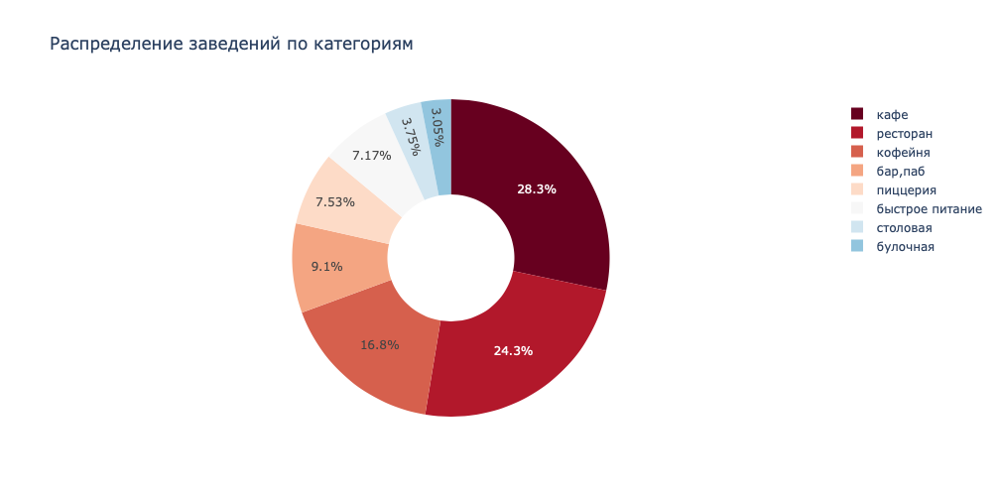

In [11]:
fig = go.Figure(go.Pie(values=places_by_categories['amount'],
                       labels=places_by_categories['category'],
                       rotation=0,
                       ))

fig.update_layout(title_text='Распределение заведений по категориям',
                  width=1000, height=500)

fig.update_traces(textinfo='percent',
                  marker=dict(colors=px.colors.sequential.RdBu),
                  hole=.4,
                  direction='clockwise')

fig.show()

Наиболее распространенные категории заведений - это кафе (28.3%), ресторан (24.3%) и кофейня (16.8%). На эти категории приходится около 70% всех заведений в Москве.  
9.1% заведений приходится на бары/пабы, 7.53% - на пиццерии, 7.17% - на быстрое питание.  
Меньше всего заведений в категориях столовая и булочная - 3.75% и 3.05%, соответственно.

#### Распределение количества посадочных мест по категориям

Исследуем количество посадочных мест в разрезе по категориям.

In [12]:
# сформируем сводную таблицу
seats_by_categories = data.pivot_table(index='category', values='seats', aggfunc='median').reset_index()
# переименуем столбцы
seats_by_categories.columns = ['category', 'seats']
# округлим среднее значение до целого
seats_by_categories['seats'] = round(seats_by_categories['seats'],0)
# отсортируем данные по убыванию среднего количества посадочных мест в категории
seats_by_categories = seats_by_categories.sort_values(by='seats', ascending=False)

seats_by_categories

,category,seats
6,ресторан,86.0
0,"бар,паб",82.0
4,кофейня,80.0
7,столовая,76.0
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


Визуализируем распределение количества посадочных мест по категориям.

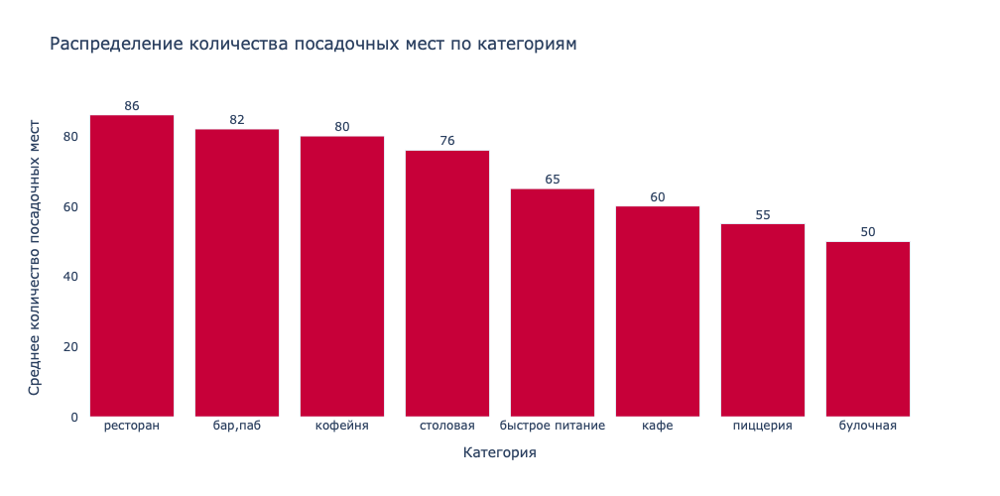

In [13]:
fig = go.Figure(go.Bar(y=seats_by_categories['seats'],
                       x=seats_by_categories['category'],
                       marker_color='#C70039',
                       text=seats_by_categories['seats'],
                       textposition='outside'
                       ))

fig.update_layout(title_text='Распределение количества посадочных мест по категориям',
                  xaxis_title='Категория',
                  yaxis_title='Среднее количество посадочных мест',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

В среднем больше всего посадочных мест в ресторанах (86), барах/пабах (82) и кофейнях (80).  
Далее идут столовые (76), заведения быстрого питания (65) и кафе (60).  
Меньше всего посадочных мест в пиццериях (55) и булочных (50).

При этом мы знаем, что у 42.96% заведений не указано количество посадочных мест.

#### Распределние средних рейтингов по категориям

Проанализируем распределение средних рейтингов по категориям заведений.

In [14]:
# сформируем сводную таблицу
ratings_by_categories = data.pivot_table(index='category', values='rating', aggfunc='mean').reset_index()
# переименуем столбцы и округлим средние значения
ratings_by_categories.columns = ['category', 'mean_rating']
ratings_by_categories['mean_rating'] = round(ratings_by_categories['mean_rating'],2)
# отсортируем данные по убыванию количества заведений в категории
ratings_by_categories = ratings_by_categories.sort_values(by='mean_rating', ascending=False)

ratings_by_categories

,category,mean_rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


Визуализируем распределение средних рейтингов по категориям заведений.

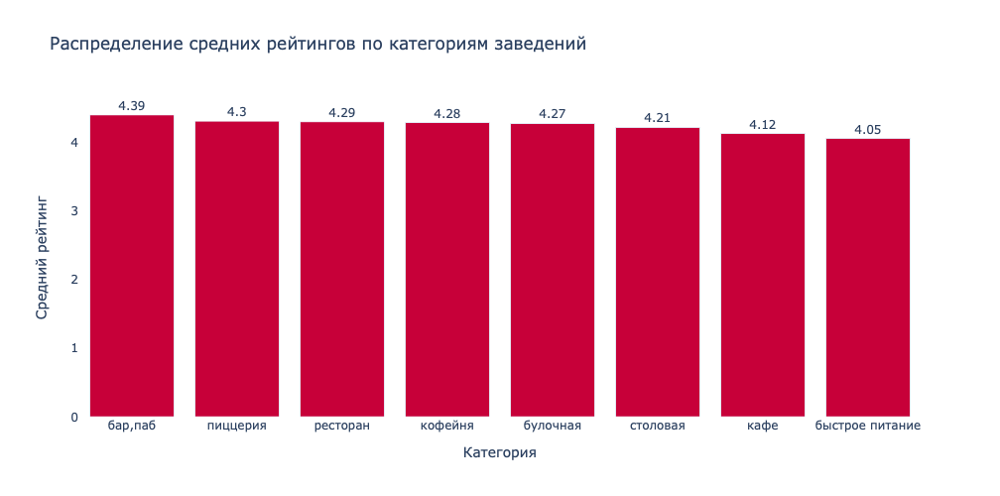

In [15]:
fig = go.Figure(go.Bar(y=ratings_by_categories['mean_rating'],
                       x=ratings_by_categories['category'],
                       marker_color='#C70039',
                       text=ratings_by_categories['mean_rating'],
                       textposition='outside'
                       ))

fig.update_layout(title_text='Распределение средних рейтингов по категориям заведений',
                  xaxis_title='Категория',
                  yaxis_title='Средний рейтинг',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

У всех категорий средний рейтинг выше 4-х - это достаточно высокий показатель.

Самый высокий рейтинг у баров/пабов - 4.39. Далее с минимальным отрывом идут пиццерии (4.3), рестораны (4.29), кофейни (4.28) и булочные (4.27). Ниже всего рейтинг у столовых (4.21), кафе (4.12) и заведений быстрого питания (4.05).

### Сети

#### Соотношение сетевых и несетевых заведений

Изучим соотношение сетевых и несетевых заведений в датафрейме.

In [16]:
# сформируем сводную таблицу
is_chain = data.pivot_table(index='chain', values='name', aggfunc='count').reset_index()
# переименуем столбцы
is_chain.columns = ['chain', 'amount']
# переименуем признак сетевого заведения для удобства восприятия
is_chain['chain'] = is_chain['chain'].replace({0:'Несетевые заведения', 1:'Cетевые заведения'})

is_chain

,chain,amount
0,Несетевые заведения,5201
1,Cетевые заведения,3205


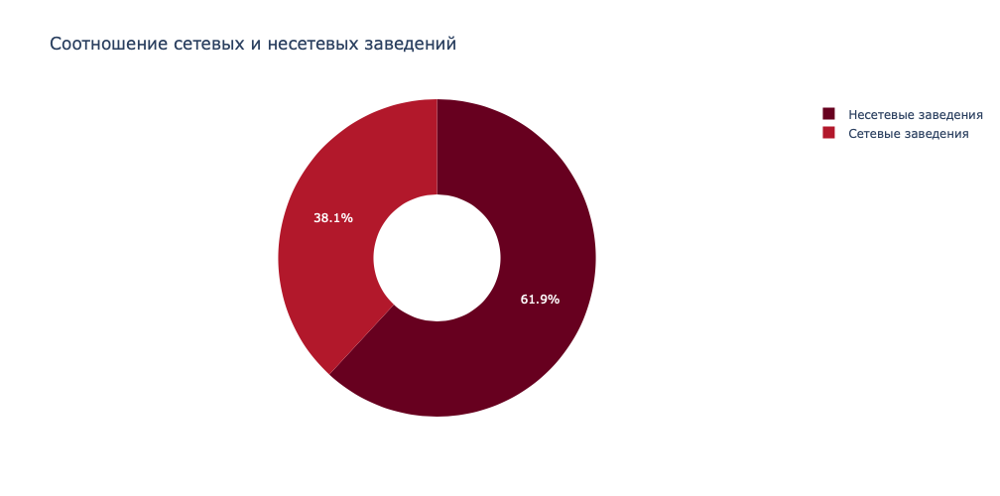

In [17]:
fig = go.Figure(go.Pie(values=is_chain['amount'],
                       labels=is_chain['chain'],
                       rotation=0,
                       ))

fig.update_layout(title_text='Соотношение сетевых и несетевых заведений',
                  width=1000, height=500)

fig.update_traces(textinfo='percent',
                  marker=dict(colors=px.colors.sequential.RdBu),
                  hole=.4,
                  direction='clockwise')

fig.show()

Большинство заведений в датафрейме - несетевые (61.9%).

#### Распределение сетевых заведений по категориям

Рассмотрим, какие категории заведений чаще являются сетевыми.

In [18]:
# сгруппируем данные
chain_places_by_categories = data.groupby('category').agg({'chain':['count','sum']}).reset_index()
# переименуем столбцы
chain_places_by_categories.columns = ['category', 'total_amount', 'chain_amount']
# рассчитаем долю сетевых заведений в категориях
chain_places_by_categories['%'] = round(
    chain_places_by_categories['chain_amount']/chain_places_by_categories['total_amount']*100, 2)
# отсортируем данные по убыванию доли сетевых заведений в категории
chain_places_by_categories = chain_places_by_categories.sort_values(by='%')

chain_places_by_categories

,category,total_amount,chain_amount,%
0,"бар,паб",765,169,22.09
7,столовая,315,88,27.94
3,кафе,2378,779,32.76
6,ресторан,2043,730,35.73
2,быстрое питание,603,232,38.47
4,кофейня,1413,720,50.96
5,пиццерия,633,330,52.13
1,булочная,256,157,61.33


Визуализируем распределение доли сетевых заведений по категориям.

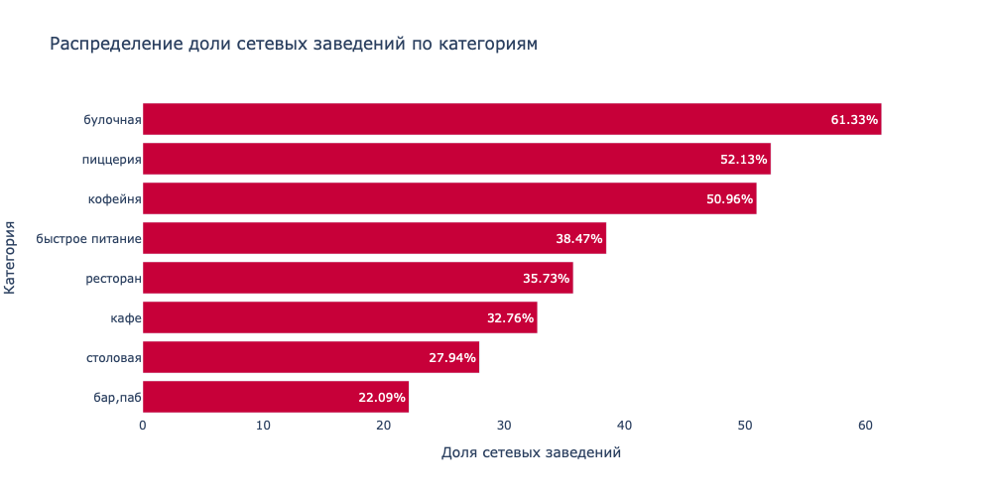

In [19]:
fig = go.Figure(go.Bar(x=chain_places_by_categories['%'],
                       y=chain_places_by_categories['category'],
                       marker_color='#C70039',
                       orientation='h',
                       text=chain_places_by_categories['%'].apply(lambda x: '{:.2f}%'.format(x)),
                       textposition='inside'
                       ))


fig.update_layout(title_text='Распределение доли сетевых заведений по категориям',
                  xaxis_title='Доля сетевых заведений',
                  yaxis_title='Категория',
                  barmode='stack',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

Наиболее часто сетевыми заведениями являются булочные (61.33%), пиццерии (52.13%) и кофейни (50.96%).  
Далее идут заведения быстрого питания (38.47%), рестораны (35.73%) и кафе (32.76%).  
Реже всего сетевыми заведениями являются столовые (27.94%) и бары/пабы (22.09%).

#### Топ-15 популярных сетей в Москве

Изучим топ-15 популярных сетей в Москве. Под популярностью мы понимаем количество заведений этой сети в регионе.

In [20]:
# выделим сетевые заведения
chain_places = data.query('chain == 1')
# сгруппируем данные сетевых заведений по названию
popular_chains = (chain_places.groupby('name').agg({'category':'first', 'chain':'count'})).reset_index()
# переименуем столбцы
popular_chains.columns = ['chain', 'category', 'amount']
# отсортируем данные по убыванию количества заведений и выделим топ-15
popular_chains = popular_chains.sort_values(by='amount', ascending=False).head(15).reset_index(drop=True)

popular_chains

,chain,category,amount
0,Шоколадница,кофейня,120
1,Домино'с Пицца,пиццерия,76
2,Додо Пицца,пиццерия,74
3,One Price Coffee,кофейня,71
4,Яндекс Лавка,ресторан,69
5,Cofix,кофейня,65
6,Prime,ресторан,50
7,Хинкальная,быстрое питание,44
8,КОФЕПОРТ,кофейня,42
9,Кулинарная лавка братьев Караваевых,кафе,39


Визуализируем распределение топ-15 популярных сетей по категориям.

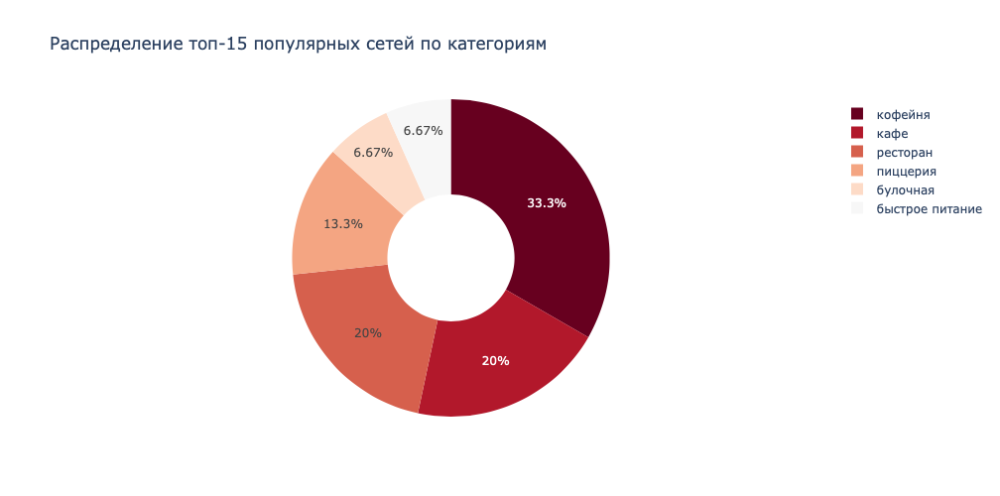

In [21]:
# сгруппируем данные по категориям
popular_chains_by_category = popular_chains.groupby('category').agg({'amount':'count'}).reset_index()
# отсортируем данные по убыванию количества заведений
popular_chains_by_category = popular_chains_by_category.sort_values(by='amount', ascending=False)

fig = go.Figure(go.Pie(values=popular_chains_by_category['amount'],
                       labels=popular_chains_by_category['category'],
                       rotation=0,
                       ))

fig.update_layout(title_text='Распределение топ-15 популярных сетей по категориям',
                  width=1000, height=500)

fig.update_traces(textinfo='percent',
                  marker=dict(colors=px.colors.sequential.RdBu),
                  hole=.4,
                  direction='clockwise')

fig.show()

Самая популярная сеть в Москве - сеть кофеен Шоколадница. Она насчитывает 120 заведений.  
Второе и третье место достаются сетям пиццерий - Домино'c Пицца и Додо Пицца - с 76 и 74 заведениями, соответственно.

Самая распространенная категория заведений в топ-15 - кофейня. Треть самых популярных сетей приходится на данную категорию.  
По 20% сетей приходится на кафе и рестораны, 13.3% - на пиццерии, и по 6.67% - на булочные и заведения быстрого питания.

### Районы

#### Распределение заведений по административным районам

Рассмотрим распределение общего количества заведений по административным районам, а также количество заведений каждой категории по административным районам.

In [22]:
# сформируем сводную таблицу
places_by_districts = data.pivot_table(index='district', values='name', aggfunc='count').reset_index()
# переименуем столбцы
places_by_districts.columns = ['district', 'amount']
# отсортируем данные по количеству заведений в районе
places_by_districts = places_by_districts.sort_values(by='amount', ascending=False)

places_by_districts

,district,amount
5,Центральный административный округ,2242
2,Северный административный округ,900
8,Южный административный округ,892
3,Северо-Восточный административный округ,891
1,Западный административный округ,851
0,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


In [23]:
# сформируем сводную таблицу
places_by_categories_districts = data.pivot_table(index=['district', 'category'], values='name', aggfunc='count').reset_index()
# добавим данные об общем количестве заведений в районе
places_by_categories_districts = places_by_categories_districts.merge(places_by_districts, on='district')
# переименуем столбцы
places_by_categories_districts.columns = ['district', 'category', 'amount', 'total_district_amount']
# рассчитаем долю категории от общего количества заведений в районе
places_by_categories_districts['%_district'] = round(
    places_by_categories_districts['amount']/places_by_categories_districts['total_district_amount']*100,2)
# сократим названия районов
places_by_categories_districts = places_by_categories_districts.replace({
    'Восточный административный округ':'ВАО',
    'Западный административный округ':'ЗАО',
    'Северный административный округ':'САО',
    'Северо-Восточный административный округ':'СВАО',
    'Северо-Западный административный округ':'СЗАО',
    'Центральный административный округ':'ЦАО',
    'Юго-Восточный административный округ':'ЮВАО',
    'Юго-Западный административный округ':'ЮЗАО',
    'Южный административный округ':'ЮАО'
})
# отсортируем данные по названию категорий
places_by_categories_districts = places_by_categories_districts.sort_values(by='category', ascending=False)

Визуализируем распределение заведений по административным районам и категориям.

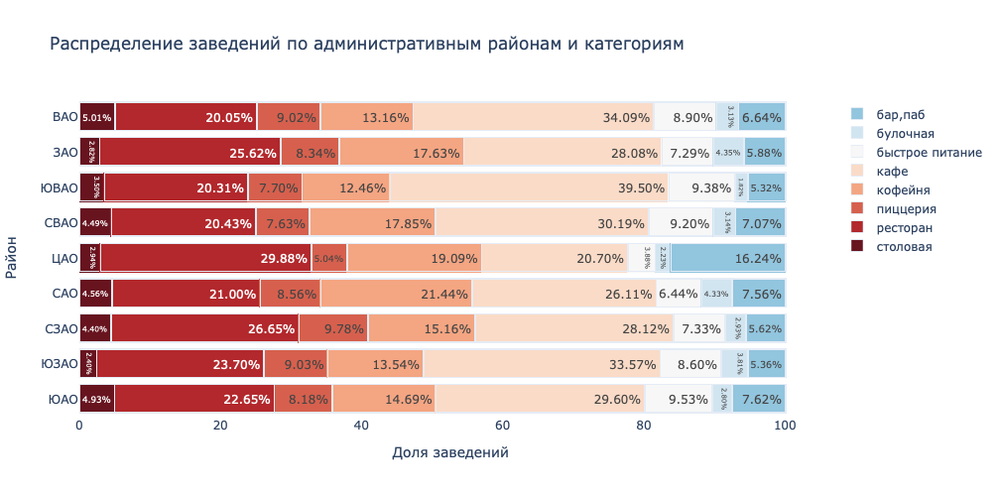

In [24]:
category_colors = {
    'столовая':'#67141F',
    'ресторан':'#B2282C',
    'пиццерия':'#D6604D',
    'кофейня':'#F4A582',
    'кафе':'#FADBC7',
    'быстрое питание':'#F7F7F7',
    'булочная':'#D1E5F0',
    'бар,паб':'#92C5DE',  
}

fig = go.Figure()

for category in places_by_categories_districts['category'].unique():
    places = places_by_categories_districts.query('category == @category')
    fig.add_trace(go.Bar(
        y=places['district'],
        x=places['%_district'],
        name=category,
        orientation='h',
        marker_color=category_colors[category],
        text=places['%_district'].apply(lambda x: '{:.2f}%'.format(x)),
        textposition='inside'
    ))


fig.update_layout(title_text='Распределение заведений по административным районам и категориям',
                  xaxis_title='Доля заведений',
                  yaxis_title='Район',
                  barmode='stack',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

Наибольшее количество заведений приходится на Центральный административный округ - более двух тысяч мест.  
Меньше всего заведений в Северо-Западном административном округе - около 400 мест.  
В остальных районах от 700 до 900 заведений.

Распределение по категориям в районах схоже и не сильно отличается от общего распределения заведений по категориям.  
Лидеры по количеству заведений - кафе, рестораны и кофейни.

#### Распределение средних рейтингов по районам

Рассмотрим распределение средних рейтингов по районам.

In [25]:
# сформируем сводную таблицу
ratings_by_districts = data.pivot_table(index='district', values='rating', aggfunc='mean').reset_index()
# переименуем столбцы и округлим средние значения
ratings_by_districts.columns = ['district', 'mean_rating']
ratings_by_districts['mean_rating'] = round(ratings_by_districts['mean_rating'],2)
# отсортируем данные по убыванию количества заведений в категории
ratings_by_districts = ratings_by_districts.sort_values(by='mean_rating', ascending=False)

ratings_by_districts

,district,mean_rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
1,Западный административный округ,4.18
8,Южный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


Визуализируем распределение средних рейтингов по районам на карте Москвы.

In [26]:
# загрузим файл с границами административных районов москвы
try:
    with open('/Users/macbook/practicum/projects/food_place_project/admin_level_geomap.geojson', 'r', encoding='utf8') as f:
        geo_json = json.load(f)
except:
    with open('/datasets/admin_level_geomap.geojson', 'r', encoding='utf8') as f:
        geo_json = json.load(f)

In [27]:
# создадим карту с центром Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
moscow_map1 = folium.Map(location=[moscow_lat, moscow_lng], tiles='Cartodb Positron')

# создадим хороплет и добавим его на карту
Choropleth(
    geo_data=geo_json,
    data=ratings_by_districts,
    columns=['district', 'mean_rating'],
    key_on='feature.name',
    fill_color='RdBu_r',
    fill_opacity=0.6,
    legend_name='Средний рейтинг заведений в районе',
).add_to(moscow_map1)

moscow_map1

Мы видим, что у всех районов средний рейтинг также выше 4-х.

Наиболее высокий рейтинг у заведений в Центральном административном округе (4.38), а самый низкий - в Юго-Восточныом административном округе (4.1).

#### Отображение заведений на карте

Дополнительно визуализируем все заведения из датафрейма на карте в формате кластеров.

In [28]:
# создадим карту с центром Москвы
moscow_map2 = folium.Map(location=[moscow_lat, moscow_lng], tiles='Cartodb Positron')

# создадим пустой кластер и добавим его на карту
marker_cluster = MarkerCluster().add_to(moscow_map2)

# напишем функцию, которая наполнит кластер данными
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['category']} {row['rating']}",
    ).add_to(marker_cluster)

# применим функцию к каждой строке датафрейма
data.apply(create_clusters, axis=1)

moscow_map2

### Улицы

#### Топ-15 улиц по количеству заведений

Изучим топ-15 улиц по количеству заведений на них.

In [29]:
# сгруппируем данные по названию улиц
popular_streets = (data.groupby('street').agg({'name':'count'})).reset_index()
# переименуем столбцы
popular_streets.columns = ['street', 'amount']
# отсортируем данные по убыванию количества заведений и выделим топ-15
popular_streets = popular_streets.sort_values(by='amount', ascending=False).head(15).reset_index(drop=True)

popular_streets

,street,amount
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [30]:
# сформируем сводную таблицу
places_by_categories_streets = data.pivot_table(index=['street', 'category'], values='name', aggfunc='count').reset_index()
# добавим данные об общем количестве заведений, расположенных на каждой улице
places_by_categories_popular_streets = places_by_categories_streets.merge(popular_streets, on='street')
# переименуем столбцы
places_by_categories_popular_streets.columns = ['street', 'category', 'amount', 'total_street_amount']
# рассчитаем долю категории от общего количества заведений в районе
places_by_categories_popular_streets['%_street'] = round(
    places_by_categories_popular_streets['amount']/places_by_categories_popular_streets['total_street_amount']*100,2)
# отсортируем данные по названию категорий
places_by_categories_popular_streets = places_by_categories_popular_streets.sort_values(by='category', ascending=False)

Визуализируем распределение количества заведений и их категорий по этим улицам.

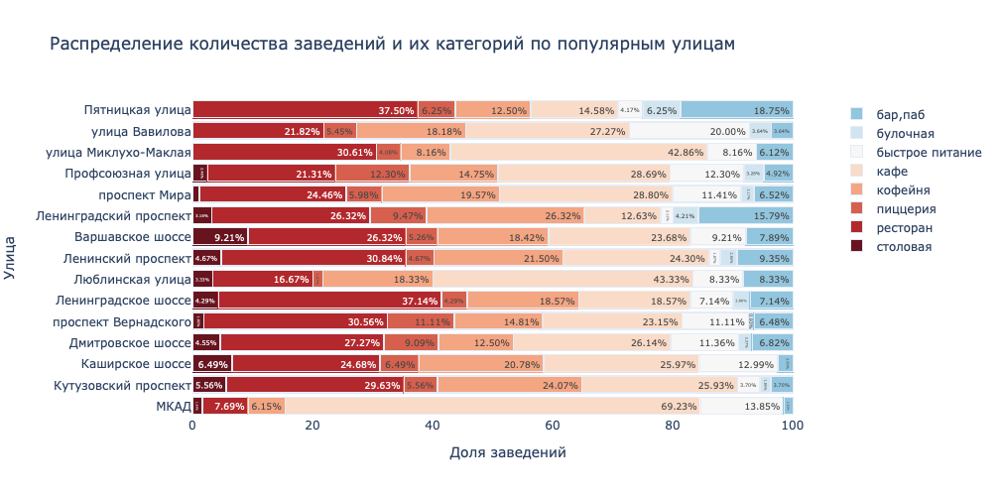

In [31]:
fig = go.Figure()

for category in places_by_categories_popular_streets['category'].unique():
    places = places_by_categories_popular_streets.query('category == @category')
    fig.add_trace(go.Bar(
        y=places['street'],
        x=places['%_street'],
        name=category,
        orientation='h',
        marker_color=category_colors[category],
        text=places['%_street'].apply(lambda x: '{:.2f}%'.format(x)),
        textposition='inside'
    ))


fig.update_layout(title_text='Распределение количества заведений и их категорий по популярным улицам',
                  xaxis_title='Доля заведений',
                  yaxis_title='Улица',
                  barmode='stack',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

В топ-15 улиц по количеству заведений входят улицы из разных районов Москвы.  
Самые популярные улицы имеют более 100 заведений на них - проспект Мира (184), Профсоюзная улица (122), проспект Вернадского (108) и Ленинский проспект (107). Скорее всего такое обилие заведений связано с протяженностью данных улиц.

Наиболее распространенные категории на популярных улицах - рестораны, кафе и кофейни, что соответствует общему распределению заведений по категориям.

#### Улицы с единственным заведением

Рассмотрим улицы, на которых находится только одно заведение.

In [32]:
# сгруппируем данные по названию улиц
lonely_streets = (data.groupby('street').agg({
    'category':'first',
    'district':'first',
    'hours':'first',
    'rating':'first',
    'price':'first',
    'chain':'first',
    'name':'count'
})).reset_index()
# переименуем столбцы
lonely_streets.columns = ['street', 'category', 'district', 'hours', 'rating', 'price', 'chain','amount']
# отфильтруем улицы с одним заведением
lonely_streets = lonely_streets.query('amount == 1')

lonely_streets.sample(10)

,street,category,district,hours,rating,price,chain,amount
439,Казарменный переулок,кофейня,Центральный административный округ,"пн-пт 08:00–20:00; сб,вс 10:00–20:00",4.2,None,1,1
325,Воробьёвская набережная,быстрое питание,Западный административный округ,"ежедневно, 10:00–22:00",4.2,средние,0,1
345,Гжельский переулок,кафе,Центральный административный округ,"ежедневно, круглосуточно",4.2,средние,1,1
218,Богословский переулок,кофейня,Центральный административный округ,пн-чт 09:00–23:00; пт-вс 10:00–23:00,4.6,средние,0,1
941,Угличская улица,кофейня,Северо-Восточный административный округ,"ежедневно, 09:00–22:00",4.1,средние,1,1
399,Жуков проезд,кофейня,Южный административный округ,пн-сб 09:00–22:00; вс 10:00–22:00,4.7,средние,0,1
9,1-й Земельный переулок,ресторан,Центральный административный округ,"ежедневно, 12:00–00:00",4.9,None,0,1
879,Старый Петровско-Разумовский проезд,столовая,Северный административный округ,пн-пт 08:00–16:00,4.2,средние,0,1
1072,проезд Донелайтиса,быстрое питание,Северо-Западный административный округ,"ежедневно, 10:00–22:00",4.4,None,0,1
838,Скотопрогонная улица,столовая,Юго-Восточный административный округ,"пн-пт 09:00–18:00; сб,вс 12:00–18:00",3.9,средние,0,1


Всего улиц с единственным заведением 458.
Они находятся в различных районах, и заведения на этих улицах относятся к разным категориям, имеют различные часы работы и ценовые категории. Некоторые из этих заведений сетевые, некоторые - нет.

Исходя из первоначального анализа, у данных улиц и заведений нет общих признаков.

### Цены

#### Распределение средних чеков по районам

Изучим распределение средних чеков по районам и посмотрим, как удалённость от центра влияет на цены в заведениях.

In [33]:
# сформируем сводную таблицу
prices_by_districts = data.pivot_table(index='district', values='middle_avg_bill', aggfunc='median').reset_index()
# переименуем столбцы и округлим средние значения
prices_by_districts.columns = ['district', 'median_price']
# отсортируем данные по убыванию количества заведений в категории
prices_by_districts = prices_by_districts.sort_values(by='median_price', ascending=False)

prices_by_districts

,district,median_price
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


Визуализируем распределение средних чеков по районам на карте Москвы.

In [34]:
# создадим карту с центром Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
moscow_map3 = folium.Map(location=[moscow_lat, moscow_lng], tiles='Cartodb Positron')

# создадим хороплет и добавим его на карту
Choropleth(
    geo_data=geo_json,
    data=prices_by_districts,
    columns=['district', 'median_price'],
    key_on='feature.name',
    fill_color='RdBu_r',
    fill_opacity=0.6,
    legend_name='Средний чек заведений в районе',
).add_to(moscow_map3)

moscow_map3

Наиболее высокий средний чек в районах Центральный административный округ и Западный административный округ - 1000 рублей.  
В остальных районах средний чек ранжируется от 450 до 700 рублей.

В целом, результаты закономерны. Средний чек в заведениях в центре Москвы выше, чем в более отдаленных районах. А в Западном административном округе есть улицы, такие как Рублевское шоссе и Кутузовский проспект, на которых расположенные заведения премиум класса.

Также мы знаем, что в этих данных 62.54% пропусков, что может оказать влияние на результаты анализа.

### Выводы

В Москве более чем 8 тысяч заведений общественного питания.

Мы выяснили, что наиболее распространенные категории заведений - кафе (28.3%), ресторан (24.3%) и кофейня (16.8%). При этом в среднем больше всего посадочных мест в в ресторанах (86), барах/пабах (82) и кофейнях (80). Также самый высокий средний рейтинг у баров/пабов (4.39), но у всех остальных категорий средний рейтинг достаточно высокий (выше 4.0).

В том, что касается сетевых заведений - их меньшинство (38.1%). Распределение сетевых заведений по категориям схоже с общим распределением - лидеры кафе, рестораны и кофейни.  
Наиболее популярные сети - сеть кофеен Шоколадница (120 заведений), и сети пиццерий - Домино'c Пицца (76 заведений) и Додо Пицца (74 заведений).

Распределение по административным районам следующее: наибольшее количество заведений приходится на Центральный административный округ - более двух тысяч мест. В остальных районах в среднем от 700 до 900 заведений. Распределение заведений по категориям в районах схоже с общим распределением - лидеры кафе, рестораны и кофейни. Наиболее высокий рейтинг у заведений в Центральном админитративном округе (4.38), но у остальных районов средний рейтинг выше 4.1.

Самые густо заполненные заведениями улицы имеют более 100 заведений, и их успех зачастую связан с их большой протяженностью, а не принадлежностью к определенному району. Наиболее распространенные категории на популярных улицах - рестораны, кафе и кофейни, что соответствует общему распределению заведений по категориям.

Касательно среднего чека, наиболее высокий средний чек в районах Центральный административный округ и Западный административный округ - 1000 рублей. В остальных районах средний чек ранжируется от 450 до 700 рублей. В целом, чем ближе к центру, тем выше цены, за исключением некоторых улиц в ЗАО с заведениями премиум класса.

## Детализация исследования: открытие кофейни

На основании проведенного исследовательского анализа было принято решение открыть кофейню.

На данном этапе нам необходимо детализировать исследование, чтобы определить где открыть кофейню, какие у нее будут условия работы и цены.

Для начала визуализируем все кофейни из датафрейма на карте в формате кластеров.

In [35]:
# выделим в датафрейме только кофейни
coffee_places = data.query('category == "кофейня"')

In [36]:
# создадим карту с центром Москвы
moscow_map4 = folium.Map(location=[moscow_lat, moscow_lng], tiles='Cartodb Positron')

# создадим пустой кластер и добавим его на карту
marker_cluster = MarkerCluster().add_to(moscow_map4)

# напишем функцию, которая наполнит кластер данными
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['category']} {row['rating']}",
    ).add_to(marker_cluster)

# применим функцию к каждой строке датафрейма
coffee_places.apply(create_clusters, axis=1)

moscow_map4

### Распределение кофеен по районам

Рассмотрим, сколько кофеен в Москве и в каких районах они расположены.

In [37]:
# посчитаем количество кофеен
coffee_places['name'].count()

1413

In [38]:
# сформируем сводную таблицу
coffee_by_districts = coffee_places.pivot_table(index='district', values='name', aggfunc='count').reset_index()
# переименуем столбцы и округлим средние значения
coffee_by_districts.columns = ['district', 'amount']
# отсортируем данные по убыванию кофеен заведений в районе
coffee_by_districts = coffee_by_districts.sort_values(by='amount', ascending=False)

coffee_by_districts

,district,amount
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


Визуализируем распределение количества кофеен по районам на карте Москвы.

In [39]:
# создадим карту с центром Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
moscow_map5 = folium.Map(location=[moscow_lat, moscow_lng], tiles='Cartodb Positron')

# создадим хороплет и добавим его на карту
Choropleth(
    geo_data=geo_json,
    data=coffee_by_districts,
    columns=['district', 'amount'],
    key_on='feature.name',
    fill_color='RdBu_r',
    fill_opacity=0.6,
    legend_name='Количество кофеен в районе',
).add_to(moscow_map5)

moscow_map5

Всего в датафрейме 1413 кофеен, при этом треть из них приходится на Центральный административный округ. Меньше всего кофеен в Северо-Западном административном округе - 62. В остальных районах в среднем от 100 до 200 кофеен.

### Круглосуточные кофейни

Изучим датафрейм на наличие круглосуточных кофеен.

In [40]:
# отфильтруем датафрейм
coffee_24_7 = coffee_places.query('is_24_7 == True')

coffee_24_7['name'].count()

59

Рассмотрим, в каких районах открыты круглосуточные кофейни.

In [41]:
# сформируем сводную таблицу
coffee_24_7_by_districts = coffee_24_7.pivot_table(index='district', values='name', aggfunc='count').reset_index()
# переименуем столбцы и округлим средние значения
coffee_24_7_by_districts.columns = ['district', 'amount']
# отсортируем данные по убыванию кофеен заведений в районе
coffee_24_7_by_districts = coffee_24_7_by_districts.sort_values(by='amount', ascending=False)

coffee_24_7_by_districts

,district,amount
5,Центральный административный округ,26
1,Западный административный округ,9
7,Юго-Западный административный округ,7
0,Восточный административный округ,5
2,Северный административный округ,5
3,Северо-Восточный административный округ,3
4,Северо-Западный административный округ,2
6,Юго-Восточный административный округ,1
8,Южный административный округ,1


Визуализируем распределение количества круглосуточных кофеен по районам.

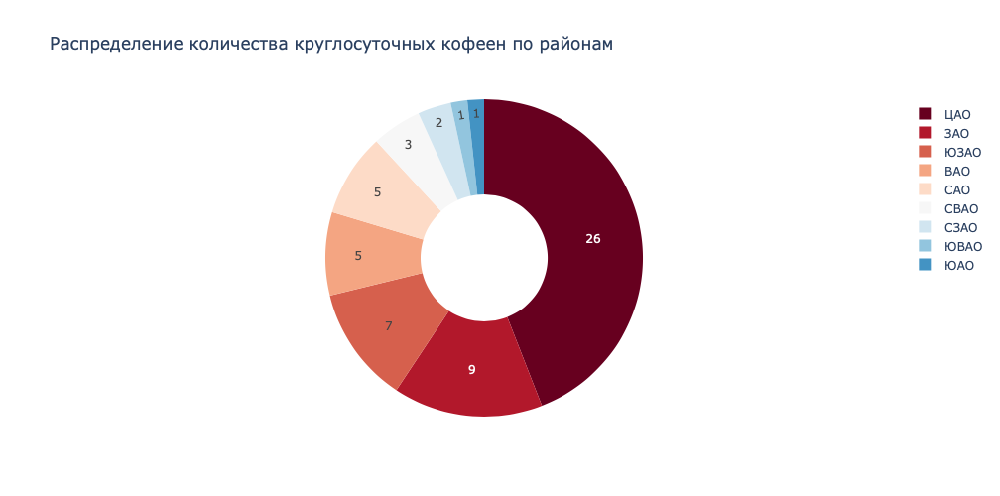

In [42]:
# сократим названия районов
coffee_24_7_by_districts = coffee_24_7_by_districts.replace({
    'Восточный административный округ':'ВАО',
    'Западный административный округ':'ЗАО',
    'Северный административный округ':'САО',
    'Северо-Восточный административный округ':'СВАО',
    'Северо-Западный административный округ':'СЗАО',
    'Центральный административный округ':'ЦАО',
    'Юго-Восточный административный округ':'ЮВАО',
    'Юго-Западный административный округ':'ЮЗАО',
    'Южный административный округ':'ЮАО'
})

fig = go.Figure(go.Pie(values=coffee_24_7_by_districts['amount'],
                       labels=coffee_24_7_by_districts['district'],
                       rotation=0,
                       ))

fig.update_layout(title_text='Распределение количества круглосуточных кофеен по районам',
                  width=1000, height=500)

fig.update_traces(textinfo='value',
                  marker=dict(colors=px.colors.sequential.RdBu),
                  hole=.4,
                  direction='clockwise')

fig.show()

Всего в Москве 59 круглосуточных кофеен, почти половина из них находится в Центральном административном округе. При этом в каждом районе есть хотя бы одна круглосуточная кофейня.

### Распределение средних рейтингов кофеен по районам

Исследуем, какие у кофеен рейтинги и как они распределяются по районам.

In [43]:
# сформируем сводную таблицу
coffee_ratings_by_districts = coffee_places.pivot_table(index='district', values='rating', aggfunc='mean').reset_index()
# переименуем столбцы и округлим средние значения
coffee_ratings_by_districts.columns = ['district', 'mean_rating']
coffee_ratings_by_districts['mean_rating'] = round(coffee_ratings_by_districts['mean_rating'],2)
# отсортируем данные по убыванию количества заведений в категории
coffee_ratings_by_districts = coffee_ratings_by_districts.sort_values(by='mean_rating', ascending=False)

coffee_ratings_by_districts

,district,mean_rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


Визуализируем распределение средних рейтингов по районам на карте Москвы.

In [44]:
# создадим карту с центром Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
moscow_map7 = folium.Map(location=[moscow_lat, moscow_lng], tiles='Cartodb Positron')

# создадим хороплет и добавим его на карту
Choropleth(
    geo_data=geo_json,
    data=coffee_ratings_by_districts,
    columns=['district', 'mean_rating'],
    key_on='feature.name',
    fill_color='RdBu_r',
    fill_opacity=0.6,
    legend_name='Средний рейтинг кофеен в районе',
).add_to(moscow_map7)

moscow_map7

Во всех районах рейтинг кофеен высокий - более 4.2.

Наиболее высокий рейтинг в Центральном и Северо-Западном административных округах - 4.34 и 4.33, соответственно.  
Далее идут Северный (4.29), Восточный (4.28) и Юго-Западный (4.28) административные округи.  
Замыкают рейтинг Юго-Восточный (4.23), Южный (4.23), Северо-ВОсточный (4.22) и Западный (4.2) административные округи.

### Распределение средней стоимости чашки капучино

Так как цель - открыть кофейню, то для определения цен мы будем ориентироваться на среднюю стоимость чашки капучино. Изучим, как она распределена по районам.

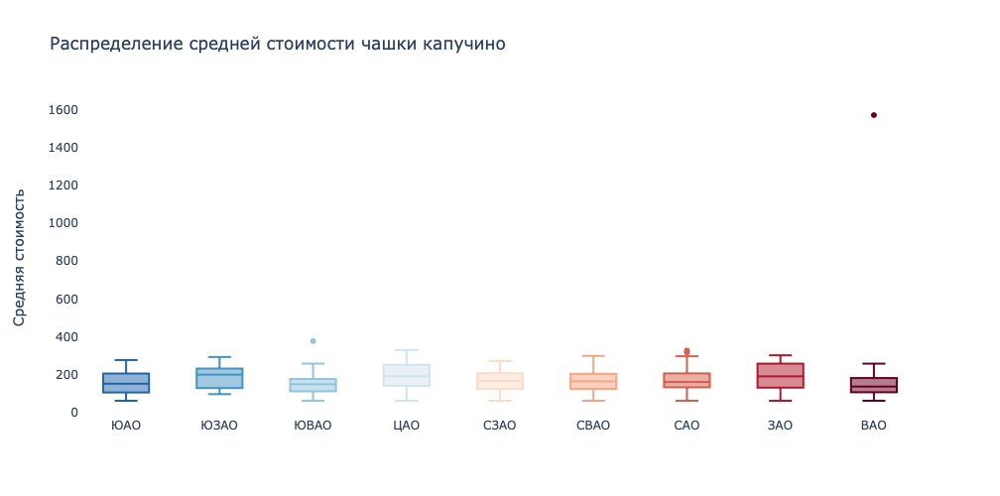

In [45]:
# сократим названия районов и отстортируем данные по ним 
short_coffee_places = coffee_places.sort_values(by='district', ascending=False).replace({
    'Восточный административный округ':'ВАО',
    'Западный административный округ':'ЗАО',
    'Северный административный округ':'САО',
    'Северо-Восточный административный округ':'СВАО',
    'Северо-Западный административный округ':'СЗАО',
    'Центральный административный округ':'ЦАО',
    'Юго-Восточный административный округ':'ЮВАО',
    'Юго-Западный административный округ':'ЮЗАО',
    'Южный административный округ':'ЮАО'
})


district_colors = {
    'ВАО':'#67001F',
    'ЗАО':'#B2182B',
    'САО':'#D6604D',
    'СВАО':'#F4A582',
    'СЗАО':'#FDDBC7',
    'ЦАО':'#D1E5F0',
    'ЮВАО':'#92C5DE',
    'ЮЗАО':'#4393C3',
    'ЮАО':'#2166AC'
}


fig = go.Figure()

for district in short_coffee_places['district'].unique():
    places = short_coffee_places.query('district == @district')
    fig.add_trace(go.Box(
        y=places['middle_coffee_cup'],
        x=places['district'],
        marker_color=district_colors[district]
    ))


fig.update_layout(title_text='Распределение средней стоимости чашки капучино',
                  yaxis_title_text='Средняя стоимость',
                  showlegend=False,
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

Ограничим график, чтобы исключить аномалии и подробнее рассмотреть данные.

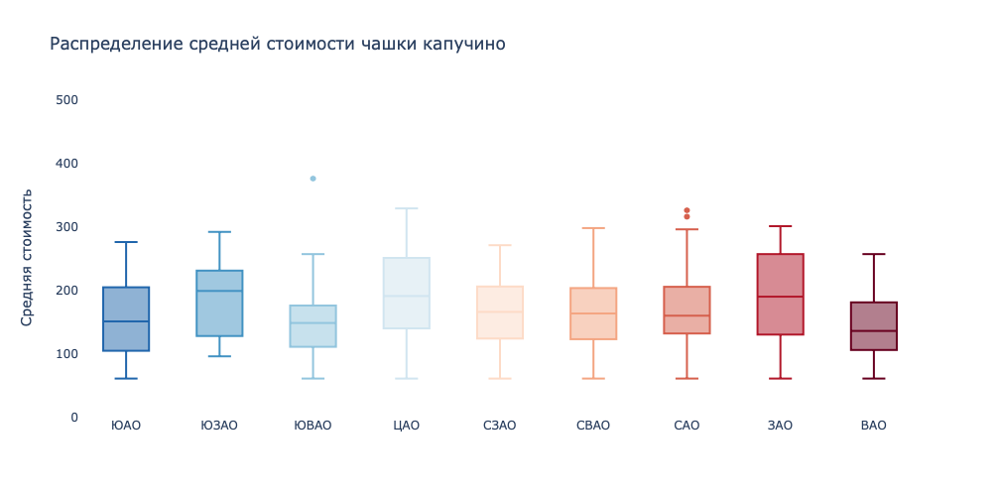

In [46]:
fig = go.Figure()

for district in short_coffee_places['district'].unique():
    places = short_coffee_places.query('district == @district')
    fig.add_trace(go.Box(
        y=places['middle_coffee_cup'],
        x=places['district'],
        marker_color=district_colors[district]
    ))


fig.update_layout(title_text='Распределение средней стоимости чашки капучино',
                  yaxis_title_text='Средняя стоимость',
                  showlegend=False,
                  yaxis=dict(range=[0, 500]),
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  width=1000, height=500)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

fig.show()

Как правило стоимость чашки капучино не превышает 400 рублей. В среднем этот показатель остается на уровне 150-200 рублей, в зависимости от района.

### Вывод и рекомендации

Мы выяснили, что наибольшее количество кофеен приходится на Центральный административный округ - 428 заведений.  
Ночных кофеен в Москве 59 и около половины из них находятся в центре.  
В том, что касается рейтингов кофеен - наиболее высокий средний рейтинг также у заведений в центре (4.34).  
Средняя стоимость чашки капучино ранжируется от 150 до 200 рублей, в зависимости от района.

Исходя из проведенного анализа мы рекомендуем открыть круглосуточную кофейню в Центральном административном округе с ценой за чашку капучино в 190 рублей.  
Центр - место притяжения москвичей и гостей столицы в любое время дня и ночи. Не смотря на большое количество заведений в хороших кофейнях зачастую практически полная посадка.  
Круглосуточный режим работы позволит будущей кофейне выделиться на фоне остальных заведений, придав ей конкурентное преимущество.
И наконец стоимость чашки капучино в 190 рублей - усредненная цена в центре, а потому достаточно привычная и приемлемая для потенциальных посетителей.

## Презентация результатов

Мы подготовили презентацию с результатами нашего исследования для инвесторов.

Презентацию можно посмотреть здесь: <https://drive.google.com/file/d/1qPaY7d21tMb6OYy-ZatS-lIGWmTh1CpF/view?usp=sharing>